In [167]:
import pandas as pd
import kagglehub
import numpy as np
import plotly.express as px
import seaborn as sns

# Download latest version
path = kagglehub.dataset_download("paresh2047/uci-semcom")
secom=pd.read_csv(f"{path}/uci-secom.csv")


from streamlit_gsheets import GSheetsConnection
import streamlit as st
conn = st.connection("gsheets", type=GSheetsConnection)
secom = conn.read()

2024-12-29 23:49:36.013 No runtime found, using MemoryCacheStorageManager
2024-12-29 23:49:36.017 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-12-29 23:49:36.018 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-12-29 23:49:36.019 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-12-29 23:49:36.526 Thread 'Thread-8': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-12-29 23:49:36.541 Thread 'Thread-8': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-12-29 23:49:42.092 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-12-29 23:49:42.093 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


In [54]:
print(secom.shape)


(1567, 592)


In [55]:
secom.columns

Index(['Time', '0', '1', '2', '3', '4', '5', '6', '7', '8',
       ...
       '581', '582', '583', '584', '585', '586', '587', '588', '589',
       'Pass/Fail'],
      dtype='object', length=592)

In [57]:
print(secom.describe)

<bound method NDFrame.describe of                      Time        0        1          2          3       4  \
0     2008-07-19 11:55:00  3030.93  2564.00  2187.7333  1411.1265  1.3602   
1     2008-07-19 12:32:00  3095.78  2465.14  2230.4222  1463.6606  0.8294   
2     2008-07-19 13:17:00  2932.61  2559.94  2186.4111  1698.0172  1.5102   
3     2008-07-19 14:43:00  2988.72  2479.90  2199.0333   909.7926  1.3204   
4     2008-07-19 15:22:00  3032.24  2502.87  2233.3667  1326.5200  1.5334   
...                   ...      ...      ...        ...        ...     ...   
1562  2008-10-16 15:13:00  2899.41  2464.36  2179.7333  3085.3781  1.4843   
1563  2008-10-16 20:49:00  3052.31  2522.55  2198.5667  1124.6595  0.8763   
1564   2008-10-17 5:26:00  2978.81  2379.78  2206.3000  1110.4967  0.8236   
1565   2008-10-17 6:01:00  2894.92  2532.01  2177.0333  1183.7287  1.5726   
1566   2008-10-17 6:07:00  2944.92  2450.76  2195.4444  2914.1792  1.5978   

          5         6       7       8  ..

In [65]:
print(secom.isnull().sum().sum())

41951


In [66]:
secom = secom.replace(np.nan, 0)


In [69]:
secom.isnull().any().any()

np.False_

In [166]:
yield_df = pd.DataFrame(secom['Pass/Fail'].value_counts()).reset_index()



pie_for_yield = px.pie(yield_df, values='count', names='Pass/Fail', title='Pass/Fail Distribution', color_discrete_map='Pastel')

pie_for_yield.update_traces(textposition='inside', textinfo='percent+label')
pie_for_yield.update_layout(showlegend=True)  # Enable the legend
pie_for_yield.show()

<Axes: >

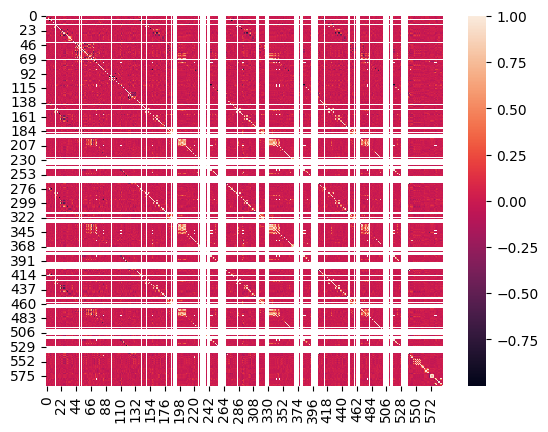

In [174]:
sns.heatmap(secom.iloc[:, 1:].corr())

In [177]:
px.imshow(secom.iloc[:, 1:].corr(),
          color_continuous_scale='blues')